In [1]:
import sys
import os
import importlib
import gc
import glob
import random
from itertools import combinations

import numpy as np
import sklearn
from sklearn import metrics

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import ticker
import seaborn as sns

import pyemma
import msmtools
import mdtraj as md

import ivac
import extq

In [2]:
sys.path.insert(1, "../../python")
sys.path.insert(1, "../../..")
import util
import plotting

In [3]:
plt.style.use("custom")  # custom style sheet
plt.style.use("muted")  # muted color theme from SciencePlots
cm_seq = sns.cubehelix_palette(
    start=0, rot=-0.70, gamma=0.40, light=0.9, dark=0.1, as_cmap=True, reverse=True
)
cm_seq2 = sns.cubehelix_palette(
    start=0, rot=-0.70, gamma=0.40, light=0.8, dark=0.1, as_cmap=True, reverse=False
)
colors = mpl.colors.to_rgba_array(
    [
        "#364B9A",
        "#4A7BB7",
        "#6EA6CD",
        "#98CAE1",
        "#C2E4EF",
        "#EAECCC",
        "#FEDA8B",
        "#FDB366",
        "#F67E4B",
        "#DD3D2D",
        "#A50026",
    ]
)
cm_div = mpl.colors.LinearSegmentedColormap.from_list("", colors)

# Load data

In [4]:
cv_trajs = list(
    np.load("../../data/raw_feat/cv_dist_spin_anton.npy", allow_pickle=True)
)
cv_trajs.extend(np.load("../../data/raw_feat/cv_dist_spin_anton2.npy"))

In [5]:
sb_labels = []
for r in ("R217", "R223", "R226", "R229", "R232"):
    for n in ("D129", "D136", "D151", "D164", "E183", "D186"):
        sb_labels.append(f"{r} - {n}")

In [6]:
sb_trajs = list(np.load("../../data/raw_feat/feat2_raw_anton.npy", allow_pickle=True))
# sb_trajs = []
# for i in range(6):
#     sb_trajs.extend(np.load(f'../../data/raw_feat/feat2_suppl_{i:02d}.npy', allow_pickle=True))
sb_trajs.extend(np.load("../../data/raw_feat/feat2_raw_anton2.npy"))

In [7]:
cv_arr = np.concatenate(cv_trajs)
sb_arr = np.concatenate(sb_trajs)
print(cv_arr.shape, sb_arr.shape)

(3170017, 2) (3170017, 60)


# Distance basis

In [8]:
dist = cv_arr[:, 0]
rot = cv_arr[:, 1]
# tic1 = livac_arr[:, 1]
# tic2 = livac_arr[:, 2]
sb1 = sb_arr[:, 42]  # R226-D129
sb2 = sb_arr[:, 47]  # R226-D186
sb3 = sb_arr[:, 48]  # R229-D129
sb4 = sb_arr[:, 53]  # R229-D186
sb5 = sb_arr[:, 59]  # R232-D186


# ellipse centered at down centroid with radii 1.1 nm and 8 deg (1 sigma in each direction)
# take points where R2-D186 < 0.5 (lower salt bridges), R2-D129 > 0.6 (upper salt bridge)
dist_ax_down = (dist + 4.240) / 1.1
rot_ax_down = (rot + 56.95) / 8
down_ids = ((dist_ax_down ** 2 + rot_ax_down ** 2) < 1) & (sb1 > 0.6) & (sb2 < 0.5)

# ellipse centered at up centroid with radii 0.84 nm and 7.6 deg (2 sigma in each direction)
# take points where R2-D129 (up) < 0.5, R3-D129 < 1.1, R3/R4-D186 salt bridges < 0.75/0.6 nm
up_ids = (
    ((((dist + 0.506) / 0.84) ** 2 + ((rot - 3.94) / 7.6) ** 2) < 1)
    & (sb1 < 0.5)
    & (sb3 < 1.1)
    & (sb4 < 0.75)
    & (sb5 < 0.6)
)

In [9]:
mask = ~(down_ids | up_ids)

# len(**_ids) is number of points in each state
down = sb_arr[down_ids]
up = sb_arr[up_ids]
other = sb_arr[mask]

# split CV data
down_cvs = cv_arr[down_ids]
up_cvs = cv_arr[up_ids]
other_cvs = cv_arr[mask]
down_sbs = sb_arr[down_ids]
up_sbs = sb_arr[up_ids]
other_sbs = cv_arr[mask]

In [10]:
assert (
    np.count_nonzero(down_ids) + np.count_nonzero(up_ids) + np.count_nonzero(mask)
) == len(cv_arr)
print(f"Number of down structures:  {len(down)}")
print(f"Number of up structures:   {len(up)}")
print(f"Number of other structures: {len(other)}")

Number of down structures:  31308
Number of up structures:   4614
Number of other structures: 3134095


## compute distance to states

In [15]:
# compute minimum distance (minimum of column) from domain to dimeric/monomeric state
def reduce_func(D_chunk, start):
    min2 = np.min(D_chunk, axis=1)
    return min2

In [16]:
d_down = []
counter = 0.0
tot = len(sb_arr)
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    sb_arr, down[::skip], n_jobs=-1, reduce_func=reduce_func
):
    d_down.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.14% completed
0.27% completed
0.41% completed
0.54% completed
0.68% completed
0.81% completed
0.95% completed
1.08% completed
1.22% completed
1.35% completed
1.49% completed
1.62% completed
1.76% completed
1.89% completed
2.03% completed
2.16% completed
2.30% completed
2.43% completed
2.57% completed
2.70% completed
2.84% completed
2.98% completed
3.11% completed
3.25% completed
3.38% completed
3.52% completed
3.65% completed
3.79% completed
3.92% completed
4.06% completed
4.19% completed
4.33% completed
4.46% completed
4.60% completed
4.73% completed
4.87% completed
5.00% completed
5.14% completed
5.27% completed
5.41% completed
5.54% completed
5.68% completed
5.82% completed
5.95% completed
6.09% completed
6.22% completed
6.36% completed
6.49% completed
6.63% completed
6.76% completed
6.90% completed
7.03% completed
7.17% completed
7.30% completed
7.44% completed
7.57% completed
7.71% completed
7.84% completed
7.98% completed
8.11% completed
8.25% completed
8.38% completed
8.52% co

In [17]:
# Set all distances of point in down state to be 0 explicitly
d_down_arr = np.reshape(np.concatenate(d_down), (-1, 1))
d_down_arr[down_ids] = 0

print(d_down_arr.shape)

(3170017, 1)


In [18]:
d_up = []
counter = 0.0
skip = 1

for chunk in metrics.pairwise_distances_chunked(
    sb_arr, up[::skip], n_jobs=20, reduce_func=reduce_func
):
    d_up.append(chunk)
    counter += float(len(chunk))
    perc = counter / tot * 100
    print(f"{perc:.2f}% completed")

0.92% completed
1.84% completed
2.75% completed
3.67% completed
4.59% completed
5.51% completed
6.42% completed
7.34% completed
8.26% completed
9.18% completed
10.09% completed
11.01% completed
11.93% completed
12.85% completed
13.76% completed
14.68% completed
15.60% completed
16.52% completed
17.43% completed
18.35% completed
19.27% completed
20.19% completed
21.11% completed
22.02% completed
22.94% completed
23.86% completed
24.78% completed
25.69% completed
26.61% completed
27.53% completed
28.45% completed
29.36% completed
30.28% completed
31.20% completed
32.12% completed
33.03% completed
33.95% completed
34.87% completed
35.79% completed
36.71% completed
37.62% completed
38.54% completed
39.46% completed
40.38% completed
41.29% completed
42.21% completed
43.13% completed
44.05% completed
44.96% completed
45.88% completed
46.80% completed
47.72% completed
48.63% completed
49.55% completed
50.47% completed
51.39% completed
52.30% completed
53.22% completed
54.14% completed
55.06% 

In [19]:
# Set all distances of point in up state to be 0 explicitly
d_up_arr = np.reshape(np.concatenate(d_up), (-1, 1))
d_up_arr[up_ids] = 0

print(d_up_arr.shape)

(3170017, 1)


In [20]:
np.save("../../data/feat2_dist_du_anton2/dist_down", d_down_arr)
np.save("../../data/feat2_dist_du_anton2/dist_up", d_up_arr)

## Basis and smoothing

In [21]:
# make smoothing function
smooth = (d_down_arr * d_up_arr) ** 0.5 / (d_down_arr + d_up_arr)

# make guess
guess_down = (d_up_arr ** 2) / (d_down_arr ** 2 + d_up_arr ** 2)
guess_up = (d_down_arr ** 2) / (d_down_arr ** 2 + d_up_arr ** 2)

# make smoothing 0 at boundaries (down and up states)
smooth[~mask] = 0
# ensure homogeneous boundary conditions for guess
guess_up[up_ids] = 1
guess_up[down_ids] = 0
guess_down[down_ids] = 1
guess_down[up_ids] = 0

In [22]:
print(smooth.shape, guess_down.shape, guess_up.shape)

(3170017, 1) (3170017, 1) (3170017, 1)


In [11]:
import random

random.seed(123)

In [12]:
s = 10
N = len(cv_arr)
inds = random.sample(range(N), N // s)

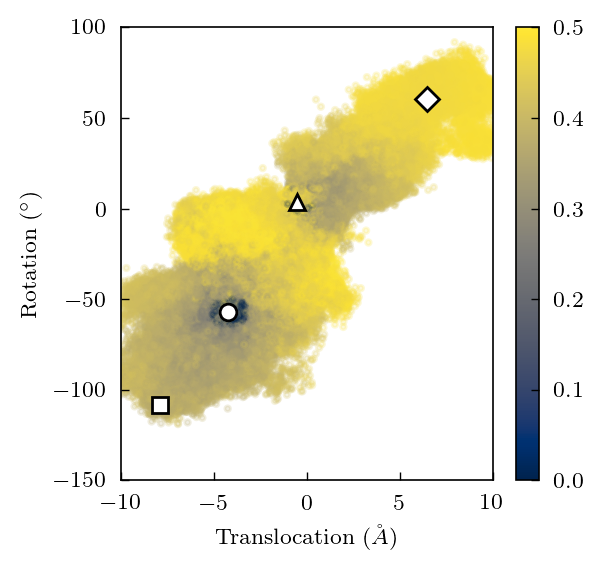

In [26]:
# Plot smoothing function
fig, ax = plt.subplots(dpi=200)
h = ax.scatter(
    cv_arr[inds, 0], cv_arr[inds, 1], c=smooth[inds], alpha=0.2, cmap="cividis"
)
cb = plt.colorbar(h, ax=ax)
cb.solids.set(alpha=1.0)
plotting.format_cvs(ax, ms=6)

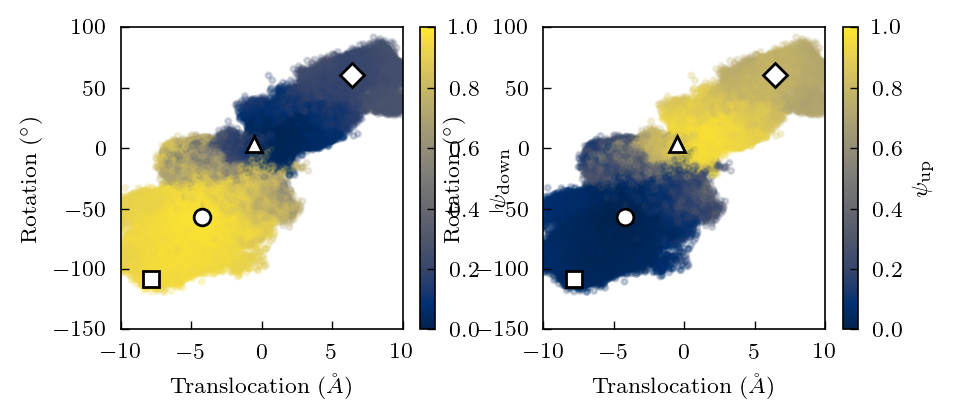

In [27]:
# Plot down and up state guess function
fig, axs = plt.subplots(1, 2, figsize=(5, 2), dpi=200)
labels = ("$\psi_{\mathrm{down}}$", "$\psi_{\mathrm{up}}$")
for ax, g, label in zip(axs, (guess_down, guess_up), labels):
    h = ax.scatter(
        cv_arr[inds, 0], cv_arr[inds, 1], c=g[inds], alpha=0.2, cmap="cividis"
    )
    cb = plt.colorbar(h, ax=ax, label=label)
    cb.solids.set(alpha=1.0)
    plotting.format_cvs(ax, ms=6)

# Weights

In [32]:
from sklearn.cluster import MiniBatchKMeans
from sklearn.neighbors import NearestNeighbors

In [33]:
# cluster IVAC points with K-means
km = MiniBatchKMeans(n_clusters=200)
km.fit(sb_arr)

In [34]:
centers = km.cluster_centers_
neighbors = NearestNeighbors(n_neighbors=1)
neighbors.fit(centers)

NearestNeighbors(n_neighbors=1)

In [35]:
dtrajs = neighbors.kneighbors(sb_arr, return_distance=False)

In [36]:
dtrajs.shape

(3170017, 1)

In [38]:
np.save("../../data/feat2_dist_du_anton2/dtrajs_200", dtrajs)

In [40]:
# split into lists of arrays
traj_inds = util.split_indices(cv_trajs)

basisL_arr = util.make_sparse_basis(np.squeeze(dtrajs))

traj_lens = [len(traj) for traj in cv_trajs]
basisL = []
curr = 0
for t_len in traj_lens:
    basisL.append(basisL_arr[curr : curr + t_len])
    curr += t_len
guessU = np.split(np.squeeze(guess_up), traj_inds)
guessD = np.split(np.squeeze(guess_down), traj_inds)

print(len(basisL), basisL[0].shape)
print(len(guessU))
print(len(guessD))

254 (10000, 200)
254
254


# DGA weights

In [13]:
lags = [1, 2, 5, 10, 20, 50, 100, 200, 500, 1000]

In [42]:
weights = []
for lag in lags:
    weights.append(extq.dga.reweight(basisL, lag))

In [43]:
len(weights[0]), len(weights[0][0])

(254, 10000)

In [44]:
np.save("../../data/feat2_dist_du_anton2/weights", weights)

/project2/roux/scguo/anaconda/envs/py39/lib/python3.9/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


In [14]:
weights = np.load("../../data/feat2_dist_du_anton2/weights.npy", allow_pickle=True)

## PMFs

In [15]:
# PMFs
dist_trajs = [traj[:, 0] for traj in cv_trajs]
rot_trajs = [traj[:, 1] for traj in cv_trajs]
xlim = np.linspace(-10, 10, 50)
ylim = np.linspace(-150, 100, 50)

In [16]:
pmf = extq.projection.density2d(dist_trajs, rot_trajs, weights[-1], xlim, ylim)

/tmp/jobs/17599323/ipykernel_3237/3250040818.py:9: RuntimeWarning: divide by zero encountered in log
  diff = -np.log(pmf.T) - min_energy


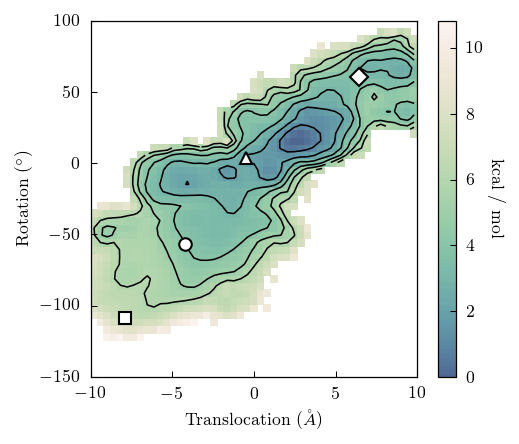

In [17]:
clines = np.linspace(0, 6, 7)
centerx = (xlim[1:] + xlim[:-1]) / 2
centery = (ylim[1:] + ylim[:-1]) / 2

f, ax = plt.subplots(figsize=(3.5, 3))

# calculate energy difference against minimum
min_energy = np.min(-np.log(pmf[np.nonzero(pmf)]))
diff = -np.log(pmf.T) - min_energy
h = ax.pcolor(xlim, ylim, diff * 0.593, cmap=cm_seq)
cb = plt.colorbar(h, ax=ax)
cb.set_label("kcal / mol", rotation=-90, labelpad=10)
ax.contour(centerx, centery, diff * 0.593, levels=clines, colors="black")
plotting.format_cvs(ax, centroids=True, ms=6)
f.tight_layout()

In [18]:
sb_ids = [42, 48, 47, 53]

In [19]:
# PMFs in sb space
pmfs_sb = []
xlim = np.linspace(0.3, 2.0, 100)
ylim = np.linspace(0.3, 2.0, 100)
for (sb1, sb2) in combinations(sb_ids, 2):
    sb1_trajs = [traj[:, sb1] for traj in sb_trajs]
    sb2_trajs = [traj[:, sb2] for traj in sb_trajs]
    pmfs_sb.append(
        extq.projection.density2d(sb1_trajs, sb2_trajs, weights[0], xlim, ylim)
    )

/tmp/jobs/17599323/ipykernel_3237/3274754222.py:9: RuntimeWarning: divide by zero encountered in log
  diff = -np.log(p.T) - min_energy


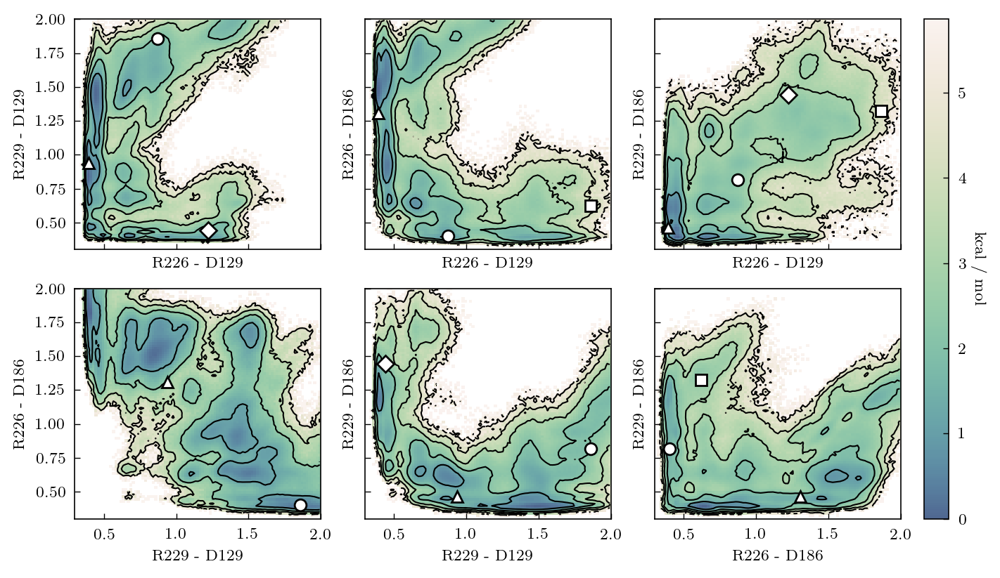

In [20]:
f, axes = plt.subplots(
    2, 3, figsize=(7, 4), sharex=True, sharey=True, constrained_layout=True, dpi=200
)

# compute grid
centerx = (xlim[1:] + xlim[:-1]) / 2
centery = (ylim[1:] + ylim[:-1]) / 2
for ((sb1, sb2), ax, p) in zip(combinations(sb_ids, 2), axes.flat, pmfs_sb):
    # calculate energy difference against minimum
    min_energy = np.min(-np.log(p[np.nonzero(p)]))
    diff = -np.log(p.T) - min_energy
    h = ax.pcolor(xlim, ylim, diff * 0.593, cmap=cm_seq)
    ax.contour(
        centerx,
        centery,
        diff * 0.593,
        levels=clines,
        colors="black",
        linestyles="solid",
    )
    ax.set_xlabel(f"{sb_labels[sb1 - 30]}")
    ax.set_ylabel(f"{sb_labels[sb2 - 30]}")

axes[0][0].set(xlim=[0.3, 2.0], ylim=[0.3, 2.0])
cb = plt.colorbar(h, ax=axes[:, -1])
cb.set_label("kcal / mol", rotation=-90, labelpad=10)
plotting.plot_sb_models(axes.flat, mode="du", centroids=True, ms=6)

# Committors

## Basis

In [ ]:
import scipy

In [ ]:
def orthogonalize(basis, pi):
    numer = 0
    denom = 0
    for b, p in zip(basis, pi):
        numer += np.einsum("m,mi,mj->ij", p, b, b)
        denom += np.sum(p)
    evals, evecs = scipy.linalg.eigh(numer / denom)
    coeffs = evecs / np.sqrt(evals)[None, :]
    return [b @ coeffs for b in basis]

In [66]:
basisF_arr = smooth * sb_arr
basisF = []
curr = 0
for t_len in traj_lens:
    basisF.append(basisF_arr[curr : curr + t_len])
    curr += t_len

basis_d = orthogonalize(basisF, weights[0])

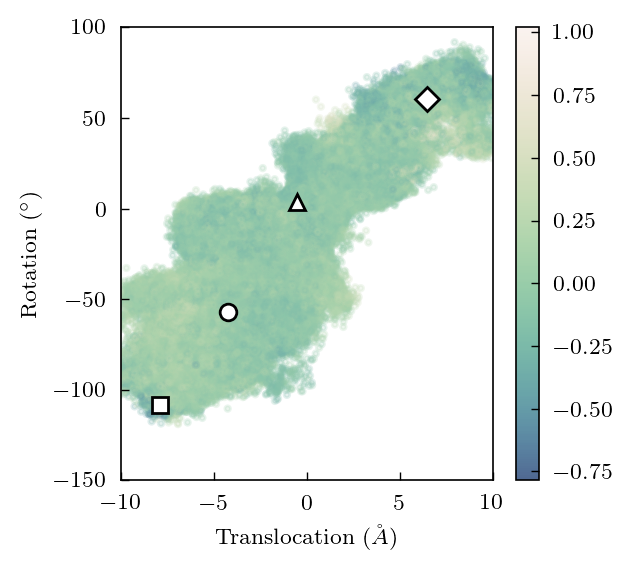

In [67]:
# Plot smoothing function
fig, ax = plt.subplots(dpi=200)
h = ax.scatter(
    cv_arr[inds, 0],
    cv_arr[inds, 1],
    c=np.mean(np.concatenate(basis_d), axis=-1)[inds],
    alpha=0.2,
    cmap=cm_seq,
)
cb = plt.colorbar(h, ax=ax)
cb.solids.set(alpha=1.0)
plotting.format_cvs(ax, ms=6)

## Calculations

In [19]:
in_domain = np.split(mask, traj_inds)
in_domain[0].shape

NameError: name 'traj_inds' is not defined

In [ ]:
len(in_domain)

In [70]:
q_downup, qb_downup = [], []
for (lag, com) in zip(lags, weights):
    print(f"Calculating committors for lag {lag}")
    q_downup.append(extq.dga.forward_committor(basis_d, com, in_domain, guessU, lag))
    qb_downup.append(extq.dga.backward_committor(basis_d, com, in_domain, guessD, lag))

Calculating committors for lag 1
Calculating committors for lag 2
Calculating committors for lag 5
Calculating committors for lag 10
Calculating committors for lag 20
Calculating committors for lag 50
Calculating committors for lag 100
Calculating committors for lag 200
Calculating committors for lag 500
Calculating committors for lag 1000


In [71]:
np.save("../../data/feat2_dist_du_anton2/q_downup", q_downup)
np.save("../../data/feat2_dist_du_anton2/qb_downup", qb_downup)

/project2/roux/scguo/anaconda/envs/py39/lib/python3.9/site-packages/numpy/core/_asarray.py:171: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return array(a, dtype, copy=False, order=order, subok=True)


In [21]:
q_downup = np.load("../../data/feat2_dist_du_anton2/q_downup.npy", allow_pickle=True)

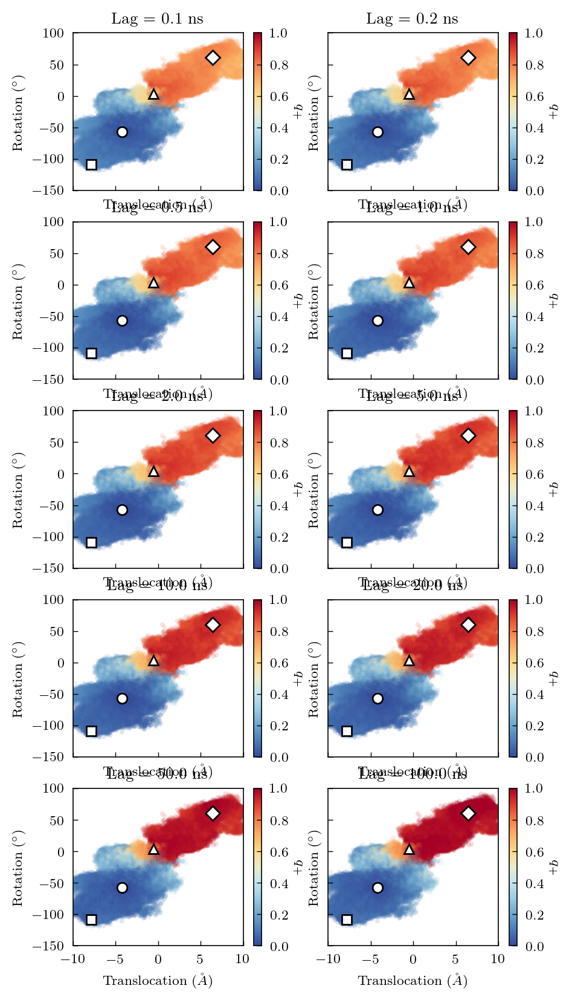

In [73]:
f, axs = plt.subplots(5, 2, figsize=(5, 10), sharex=True, sharey=True, dpi=200)
for lag, q, ax in zip(lags, q_downup, axs.flat):
    q_arr = np.concatenate(q).clip(min=0.0, max=1.0)
    h = ax.scatter(*cv_arr[inds].T, c=q_arr[inds], cmap=cm_div, alpha=0.1)
    cbar = plt.colorbar(h, ax=ax)
    cbar.solids.set(alpha=1)
    ax.set_title(f"Lag = {lag * 0.1} ns")
    plotting.format_cvs(ax, centroids=True, ms=6)
    cbar.set_label("$q_+$", rotation=-90, labelpad=10)

# axs.flat[0].legend(['Down-', 'Down', 'Up', "Up+"], loc="lower right")

/tmp/jobs/17143759/ipykernel_128818/442115343.py:19: RuntimeWarning: invalid value encountered in true_divide
  h = ax.pcolor(xe, ye, (q_dens / w_dens).T, cmap=cm_div, vmin=0, vmax=1)


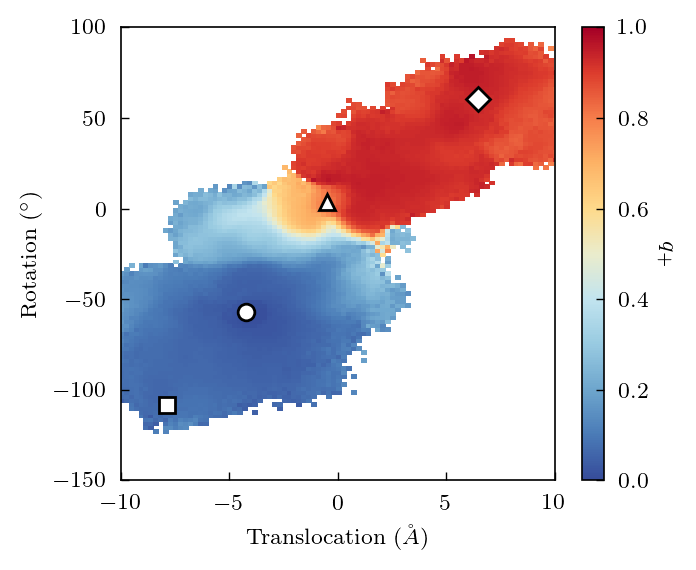

In [74]:
com = np.concatenate(weights[7])  # 20 ns lag
q_arr = np.concatenate(q_downup[7]).clip(min=0, max=1)
q_dens, xe, ye = np.histogram2d(
    cv_arr[:, 0], cv_arr[:, 1], bins=100, density=False, weights=q_arr * com
)
w_dens, _, _ = np.histogram2d(
    cv_arr[:, 0], cv_arr[:, 1], bins=100, density=False, weights=com
)

f, ax = plt.subplots(figsize=(3.5, 3), dpi=200)
h = ax.pcolor(xe, ye, (q_dens / w_dens).T, cmap=cm_div, vmin=0, vmax=1)
cb = plt.colorbar(h, ax=ax)
cb.set_label("$q_+$", rotation=-90, labelpad=10)
plotting.format_cvs(ax, centroids=True, ms=6)

/tmp/jobs/17143759/ipykernel_128818/3747278993.py:12: RuntimeWarning: invalid value encountered in true_divide
  h = ax.pcolor(xe, ye, (qb_dens / w_dens).T, cmap=cm_div, vmin=0, vmax=1)


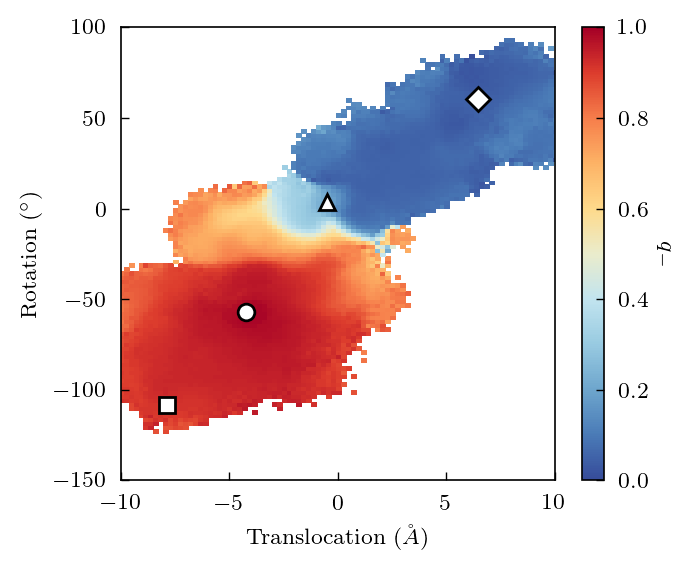

In [76]:
com = np.concatenate(weights[7])  # 20 ns lag
qb_arr = np.concatenate(qb_downup[7]).clip(min=0, max=1)
qb_dens, xe, ye = np.histogram2d(
    cv_arr[:, 0], cv_arr[:, 1], bins=100, density=False, weights=qb_arr * com
)

f, ax = plt.subplots(figsize=(3.5, 3), dpi=200)
h = ax.pcolor(xe, ye, (qb_dens / w_dens).T, cmap=cm_div, vmin=0, vmax=1)
cb = plt.colorbar(h, ax=ax)
cb.set_label("$q_-$", rotation=-90, labelpad=10)
plotting.format_cvs(ax, centroids=True, ms=6)

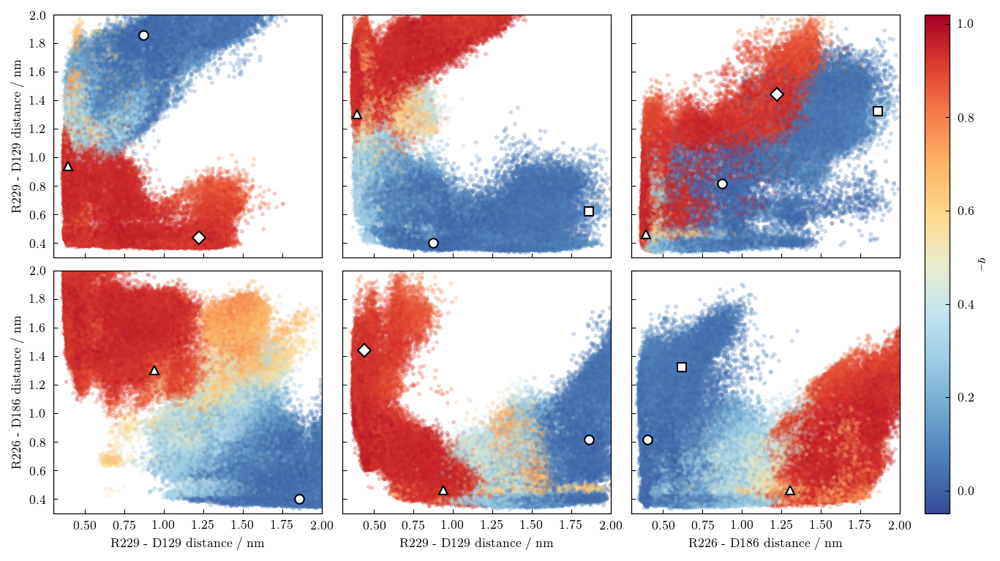

In [78]:
f, axes = plt.subplots(
    2, 3, figsize=(9, 5), sharex=True, sharey=True, constrained_layout=True
)

q_arr = np.concatenate(q_downup[7])
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    h = ax.scatter(
        sb_arr[inds, sb1], sb_arr[inds, sb2], c=q_arr[inds], cmap=cm_div, alpha=0.2
    )
    ax.set(
        xlabel=f"{sb_labels[sb1 - 30]} distance / nm",
        ylabel=f"{sb_labels[sb2 - 30]} distance / nm",
        xlim=[0.3, 2.0],
        ylim=[0.3, 2.0],
    )
    ax.label_outer()

cbar = f.colorbar(h, ax=axes[:, -1])
cbar.solids.set(alpha=1)
cbar.set_label("$q_-$", rotation=-90, labelpad=10)

plotting.plot_sb_models(axes.flat, mode="du", centroids=True, ms=6)

# f.tight_layout()

In [22]:
sb_models = np.load("../../data/models_centroids_feat2.npy")

/tmp/jobs/17256319/ipykernel_1329/2118887581.py:25: RuntimeWarning: invalid value encountered in true_divide
  xe, ye, (q_dens / w_dens).T, cmap=cm_div, vmin=0, vmax=1)


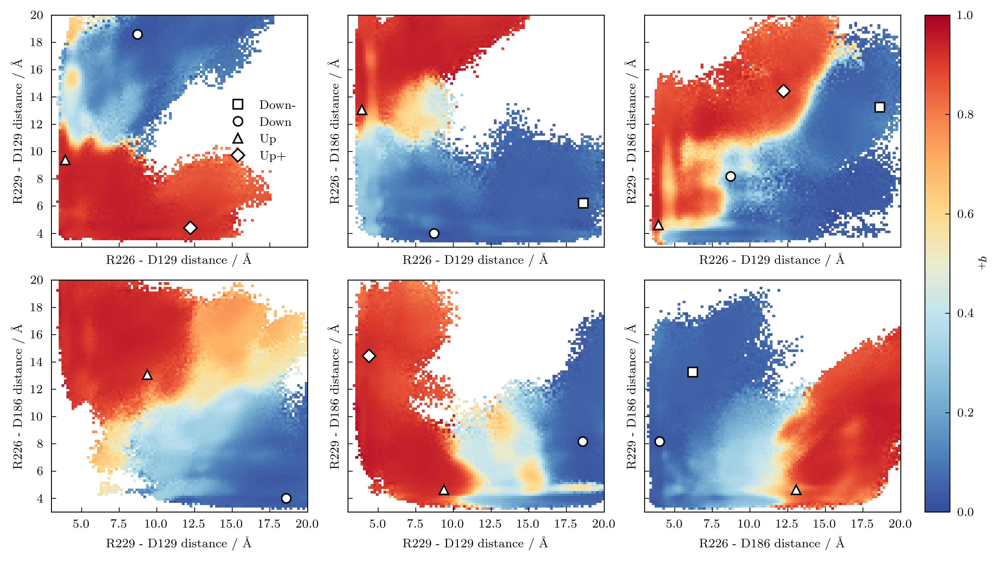

In [27]:
f, axes = plt.subplots(
    2, 3, figsize=(9, 5), dpi=400, sharex=True, sharey=True, constrained_layout=True
)

com = np.concatenate(weights[7])  # 20 ns lag
q_arr = np.concatenate(q_downup[7])
r = [[3, 20], [3, 20]]
for ((sb1, sb2), ax) in zip(combinations(sb_ids, 2), axes.flat):
    q_dens, xe, ye = np.histogram2d(
        sb_arr[:, sb1] * 10,
        sb_arr[:, sb2] * 10,
        bins=100,
        density=False,
        range=r,
        weights=q_arr * com,
    )
    w_dens, _, _ = np.histogram2d(
        sb_arr[:, sb1] * 10,
        sb_arr[:, sb2] * 10,
        bins=100,
        density=False,
        range=r,
        weights=com,
    )
    h = ax.pcolor(xe, ye, (q_dens / w_dens).T, cmap=cm_div, vmin=0, vmax=1)
    ax.set(
        xlabel=f"{sb_labels[sb1 - 30]} distance / Å",
        ylabel=f"{sb_labels[sb2 - 30]} distance / Å",
        xlim=r[0],
        ylim=r[1],
    )

    plotting.plot_models(ax, sb_models[:, [sb1, sb2]] * 10, ms=6)
    # ax.label_outer()

axes.flat[0].legend(loc="right")
cbar = f.colorbar(h, ax=axes[:, -1])
cbar.solids.set(alpha=1)
cbar.set_label("$q_+$", rotation=-90, labelpad=10)

# plotting.plot_sb_models(axes.flat, mode='du', centroids=True, ms=6)

# f.tight_layout()

/tmp/jobs/17143759/ipykernel_128818/4259933820.py:24: RuntimeWarning: invalid value encountered in true_divide
  xe, ye, (q_dens / w_dens).T, cmap=cm_div, vmin=0, vmax=1)


[(3.0, 16.0), (3.0, 16.0)]

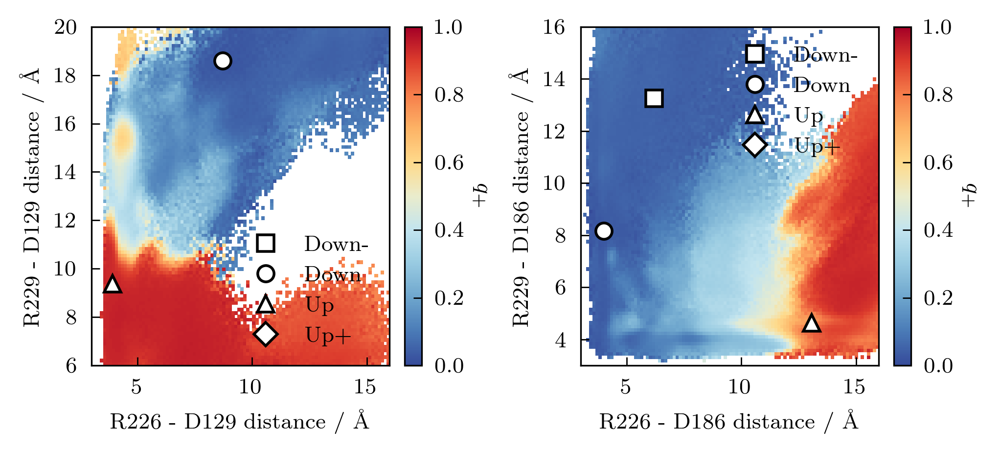

In [82]:
f, axes = plt.subplots(1, 2, figsize=(5, 2.2), dpi=400, constrained_layout=True)

q_arr = np.concatenate(q_downup[7])
range0 = [[3, 16], [6, 20]]
range1 = [[3, 16], [3, 16]]
for ((sb1, sb2), ax, r) in zip(((42, 48), (47, 53)), axes.flat, (range0, range1)):
    q_dens, xe, ye = np.histogram2d(
        sb_arr[:, sb1] * 10,
        sb_arr[:, sb2] * 10,
        bins=100,
        density=False,
        range=r,
        weights=q_arr * com,
    )
    w_dens, _, _ = np.histogram2d(
        sb_arr[:, sb1] * 10,
        sb_arr[:, sb2] * 10,
        bins=100,
        density=False,
        range=r,
        weights=com,
    )
    h = ax.pcolor(xe, ye, (q_dens / w_dens).T, cmap=cm_div, vmin=0, vmax=1)
    ax.set(
        xlabel=f"{sb_labels[sb1 - 30]} distance / Å",
        ylabel=f"{sb_labels[sb2 - 30]} distance / Å",
    )
    cb = plt.colorbar(h, ax=ax)
    cb.solids.set(alpha=1)
    cb.set_label("$q_+$", rotation=-90, labelpad=10)

    plotting.plot_models(ax, sb_models[:, [sb1, sb2]] * 10, ms=6)

axes[0].legend(loc="lower right")
axes[1].legend(loc="upper right")
axes[0].set(xlim=range0[0], ylim=range0[1])
axes[1].set(xlim=range1[0], ylim=range1[1])

# f.tight_layout()

/tmp/jobs/17143759/ipykernel_128818/2250417918.py:24: RuntimeWarning: invalid value encountered in true_divide
  xe, ye, (q_dens / w_dens).T, cmap=cm_div, vmin=0, vmax=1)


[(3.0, 16.0), (3.0, 16.0)]

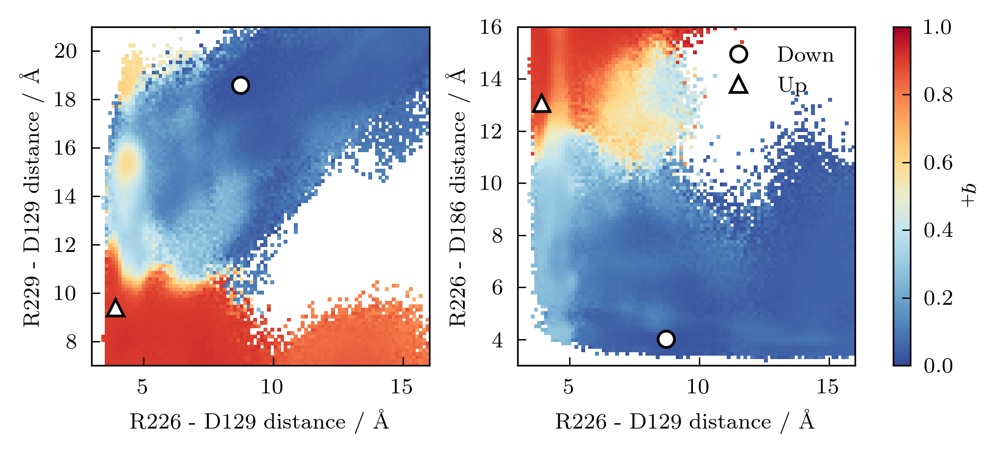

In [83]:
f, axes = plt.subplots(1, 2, figsize=(5, 2.2), dpi=400, constrained_layout=True)

q_arr = np.concatenate(q_downup[5]).clip(min=0, max=1)
range0 = [[3, 16], [7, 21]]
range1 = [[3, 16], [3, 16]]
for ((sb1, sb2), ax, r) in zip(((42, 48), (42, 47)), axes.flat, (range0, range1)):
    q_dens, xe, ye = np.histogram2d(
        sb_arr[:, sb1] * 10,
        sb_arr[:, sb2] * 10,
        bins=100,
        density=False,
        range=r,
        weights=q_arr * com,
    )
    w_dens, _, _ = np.histogram2d(
        sb_arr[:, sb1] * 10,
        sb_arr[:, sb2] * 10,
        bins=100,
        density=False,
        range=r,
        weights=com,
    )
    h = ax.pcolor(xe, ye, (q_dens / w_dens).T, cmap=cm_div, vmin=0, vmax=1)
    ax.set(
        xlabel=f"{sb_labels[sb1 - 30]} distance / Å",
        ylabel=f"{sb_labels[sb2 - 30]} distance / Å",
    )
    # plotting.plot_models(ax, sb_models[:, [sb1, sb2]] * 10, ms=6)
    ax.plot(
        sb_models[1, sb1] * 10,
        sb_models[1, sb2] * 10,
        "o",
        mfc="w",
        mec="k",
        ms=6,
        label="Down",
    )
    ax.plot(
        sb_models[2, sb1] * 10,
        sb_models[2, sb2] * 10,
        "^",
        mfc="w",
        mec="k",
        ms=6,
        label="Up",
    )

cb = plt.colorbar(h, ax=axes)
cb.set_label("$q_+$", rotation=-90, labelpad=10)
# plt.legend(bbox_to_anchor=(0.0, -0.1), loc='upper right', frameon='True')
axes[1].legend(loc="upper right")
# axes[1].legend(loc='upper right')
axes[0].set(xlim=range0[0], ylim=range0[1])
axes[1].set(xlim=range1[0], ylim=range1[1])

## 3D projections

In [23]:
centroids = np.loadtxt("../../models/MD-clustering-center/all.txt")

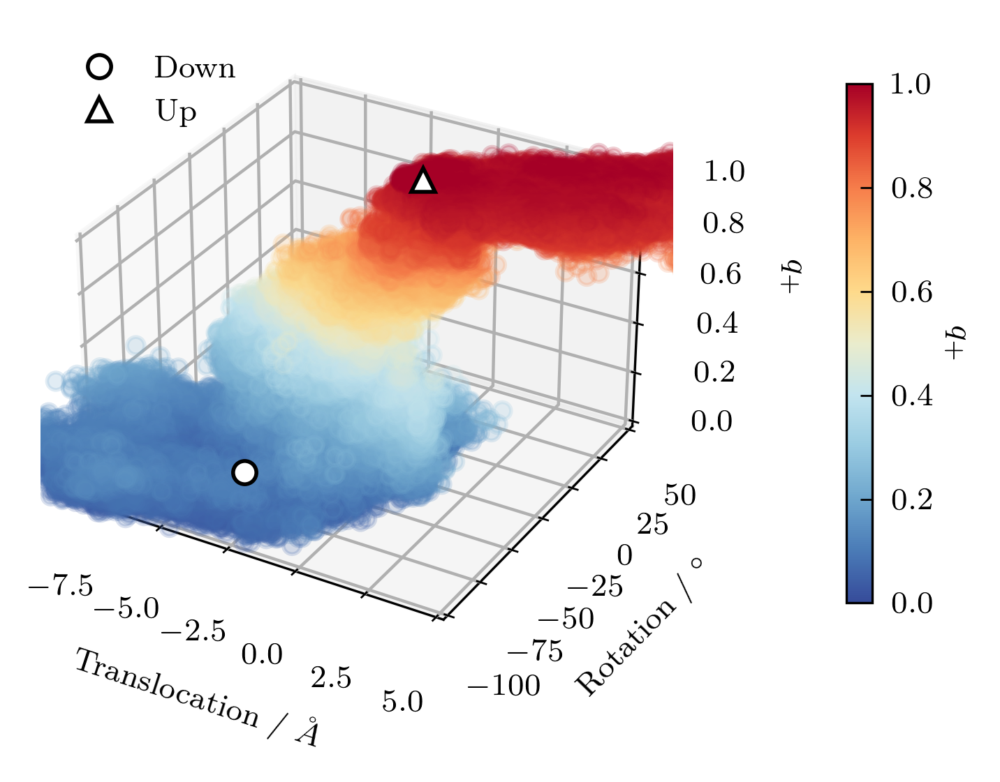

In [85]:
f = plt.figure(figsize=(4, 3), dpi=400)
ax = f.add_subplot(projection="3d")

q = np.concatenate(q_downup[7]).clip(min=0, max=1)
h = ax.scatter(
    cv_arr[inds, 0], cv_arr[inds, 1], q[inds], c=q[inds], cmap=cm_div, alpha=0.2
)
ax.set_xlabel("Translocation / $\AA$")
ax.set_ylabel("Rotation / $^\circ$")
ax.zaxis.set_rotate_label(False)
ax.set_zlabel("$q_+$", rotation=-90)
ax.set_xlim([-7.5, 5])
ax.set_ylim([-100, 50])
ax.set_zlim([0, 1.0])
cbar = plt.colorbar(h, ax=ax, pad=0.2, fraction=0.03, label="$q_+$")
cbar.solids.set(alpha=1)
cbar.set_label("$q_+$", rotation=-90, labelpad=10)
# ax.set_title('Committor, down to up transition, 10 ns lag')

ax.grid(visible=True)
ax.plot(
    centroids[1, 0],
    centroids[1, 1],
    0,
    "o",
    mec="k",
    mfc="w",
    ms=6,
    zorder=5,
    label="Down",
)
ax.plot(
    centroids[2, 0],
    centroids[2, 1],
    1,
    "^",
    mec="k",
    mfc="w",
    ms=6,
    zorder=5,
    label="Up",
)
ax.legend(loc="upper left")
# plt.savefig("../../fig/committors/q_feat2_dist_du_suppl_dsq_5ns.png", dpi=300)

In [24]:
feat2_models = sb_models

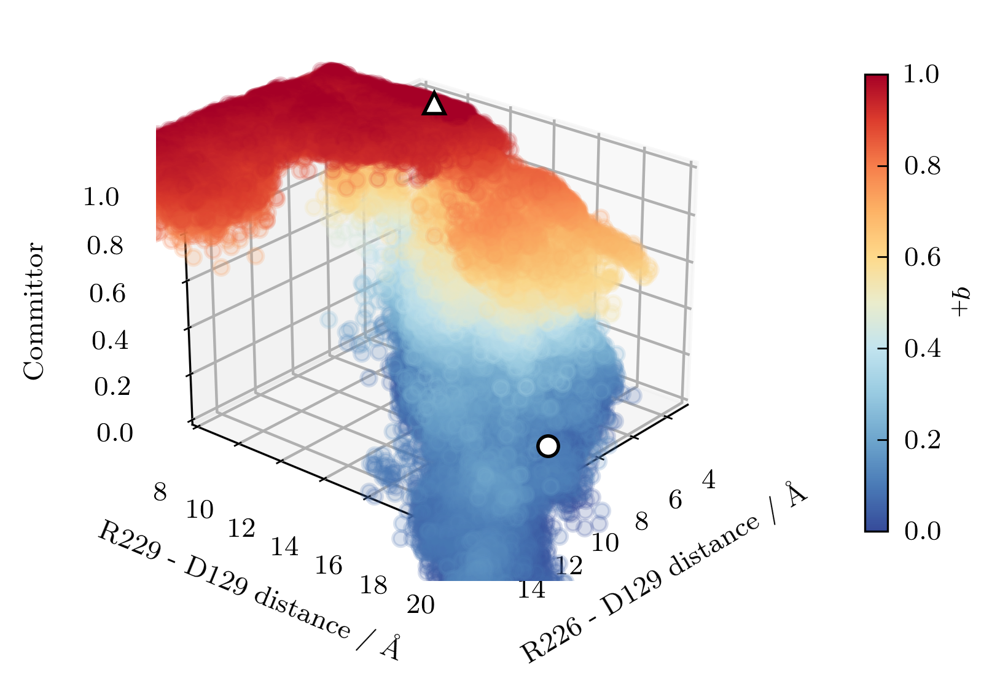

In [88]:
f = plt.figure(figsize=(4, 3), dpi=400)
ax = f.add_subplot(projection="3d")

ax.scatter(
    sb_arr[inds, sb_ids[0]] * 10,
    sb_arr[inds, sb_ids[1]] * 10,
    q[inds],
    c=q[inds],
    cmap=cm_div,
    alpha=0.2,
)
ax.set_xlabel(f"{sb_labels[sb_ids[0] - 30]} distance / Å")
ax.set_ylabel(f"{sb_labels[sb_ids[1] - 30]} distance / Å")
ax.zaxis.set_rotate_label(False)
ax.set_zlabel("Committor", rotation=90)
ax.set_xlim([3, 15])
ax.set_ylim([8, 20])
ax.set_zlim([0, 1.0])
cbar = plt.colorbar(h, ax=ax, pad=0.2, fraction=0.03, label="$q_+$")
cbar.solids.set(alpha=1)
cbar.set_label("$q_+$", rotation=-90, labelpad=10)
# ax.set_title('Committor, down to up transition, 20 ns lag')

ax.grid(visible=True)
ax.plot(
    feat2_models[1, sb_ids[0]] * 10,
    feat2_models[1, sb_ids[1]] * 10,
    0,
    "o",
    mec="k",
    mfc="w",
    ms=6,
    zorder=3,
    label="Down",
)
ax.plot(
    feat2_models[2, sb_ids[0]] * 10,
    feat2_models[2, sb_ids[1]] * 10,
    1,
    "^",
    mec="k",
    mfc="w",
    ms=6,
    zorder=3,
    label="Up",
)
# ax.legend(['Down', 'Up'], loc='upper right')

ax.view_init(azim=40, elev=25)
# plt.savefig("../../fig/committors/q_feat2_dist_du_suppl_sb12q_5ns.png", dpi=300)

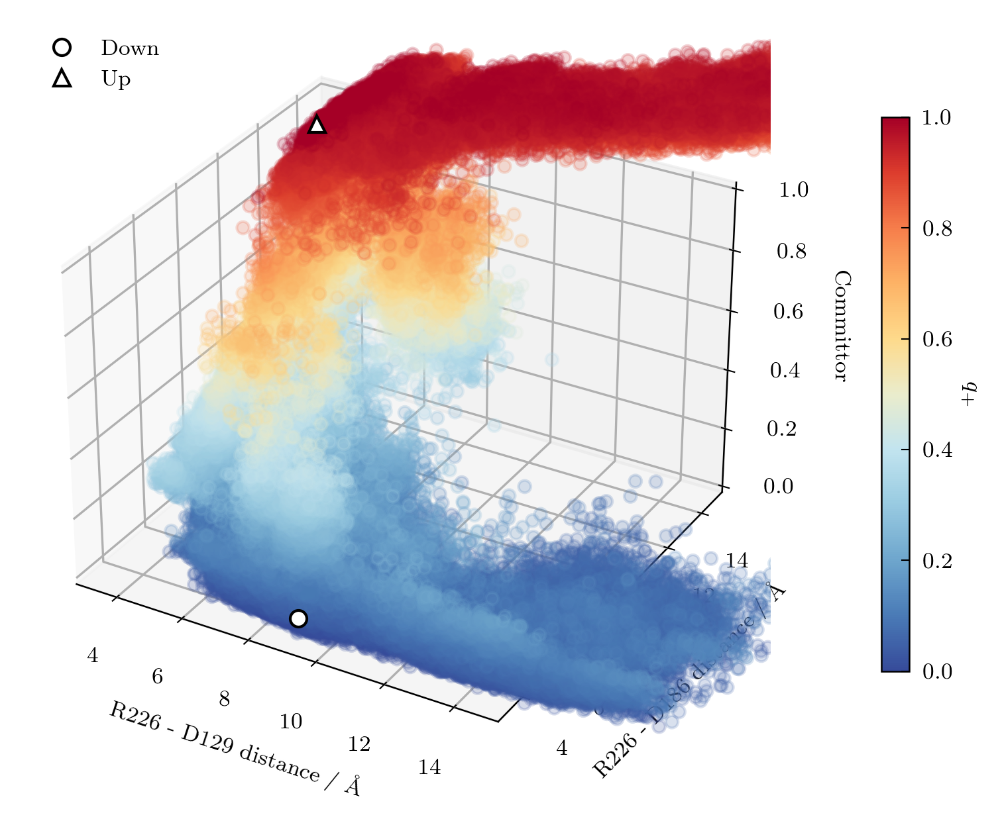

In [89]:
f = plt.figure(figsize=(6, 5), dpi=300)
ax = f.add_subplot(projection="3d")

ax.scatter(
    sb_arr[inds, sb_ids[0]] * 10,
    sb_arr[inds, sb_ids[2]] * 10,
    q[inds],
    c=q[inds],
    cmap=cm_div,
    alpha=0.2,
)
ax.set_xlabel(f"{sb_labels[sb_ids[0] - 30]} distance / Å")
ax.set_ylabel(f"{sb_labels[sb_ids[2] - 30]} distance / Å")
ax.zaxis.set_rotate_label(False)
ax.set_zlabel("Committor", rotation=-90)
ax.set_xlim([3, 15])
ax.set_ylim([3, 15])
ax.set_zlim([0, 1.0])
cbar = plt.colorbar(h, ax=ax, pad=0.12, fraction=0.03, label="$q_+$")
cbar.solids.set(alpha=1)
cbar.set_label("$q_+$", rotation=-90, labelpad=10)
# ax.set_title('Committor, down to up transition, 20 ns lag')

ax.grid(visible=True)
ax.plot(
    feat2_models[1, sb_ids[0]] * 10,
    feat2_models[1, sb_ids[2]] * 10,
    0,
    "o",
    mec="k",
    mfc="w",
    ms=6,
    zorder=5,
    label="Down",
)
ax.plot(
    feat2_models[2, sb_ids[0]] * 10,
    feat2_models[2, sb_ids[2]] * 10,
    1,
    "^",
    mec="k",
    mfc="w",
    ms=6,
    zorder=5,
    label="Up",
)
ax.legend(loc="upper left")

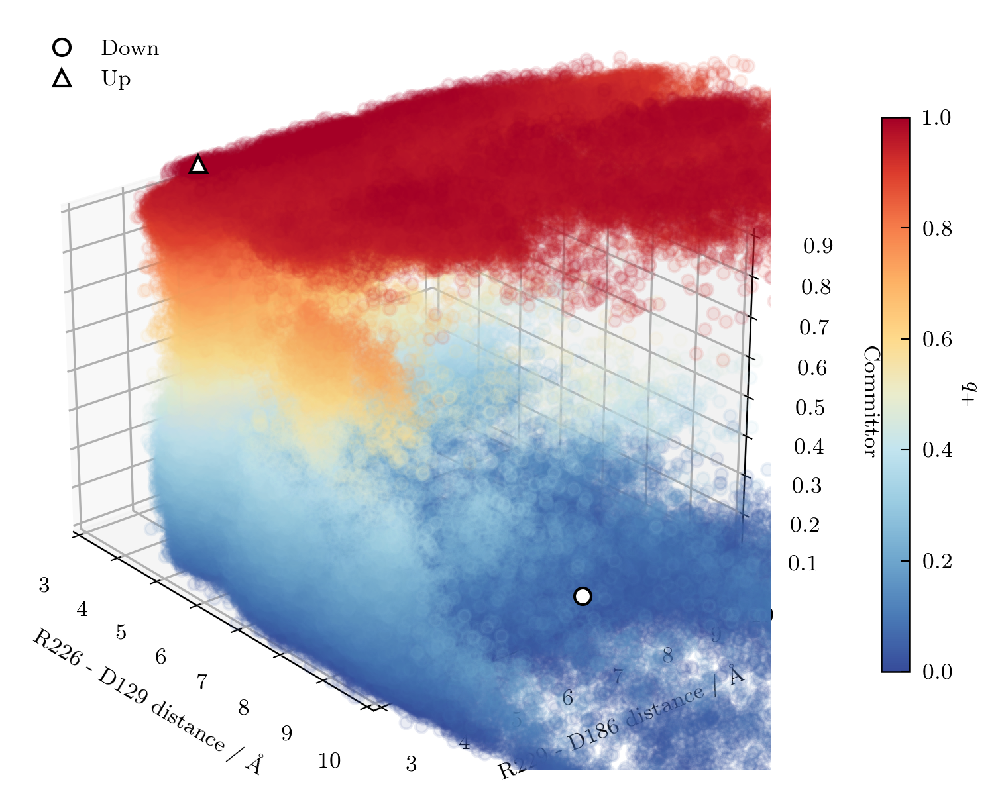

In [35]:
f = plt.figure(figsize=(6, 5), dpi=300)
ax = f.add_subplot(projection="3d")

q = np.concatenate(q_downup[7]).clip(min=0, max=1)
ax.scatter(
    sb_arr[inds, sb_ids[0]] * 10,
    sb_arr[inds, sb_ids[3]] * 10,
    q[inds],
    c=q[inds],
    cmap=cm_div,
    alpha=0.1,
)
ax.set_xlabel(f"{sb_labels[sb_ids[0] - 30]} distance / Å")
ax.set_ylabel(f"{sb_labels[sb_ids[3] - 30]} distance / Å")
ax.zaxis.set_rotate_label(False)
ax.set_zlabel("Committor", rotation=-90)
ax.set_xlim([3, 10])
ax.set_ylim([3, 10])
ax.set_zlim([0.1, 0.9])
cbar = plt.colorbar(h, ax=ax, pad=0.12, fraction=0.03, label="$q_+$")
cbar.solids.set(alpha=1)
cbar.set_label("$q_+$", rotation=-90, labelpad=10)
# ax.set_title('Committor, down to up transition, 20 ns lag')

ax.grid(visible=True)
ax.plot(
    feat2_models[1, sb_ids[0]] * 10,
    feat2_models[1, sb_ids[3]] * 10,
    0,
    "o",
    mec="k",
    mfc="w",
    ms=6,
    zorder=5,
    label="Down",
)
ax.plot(
    feat2_models[2, sb_ids[0]] * 10,
    feat2_models[2, sb_ids[3]] * 10,
    1,
    "^",
    mec="k",
    mfc="w",
    ms=6,
    zorder=5,
    label="Up",
)
ax.legend(loc="upper left")
ax.view_init(azim=-40, elev=25)

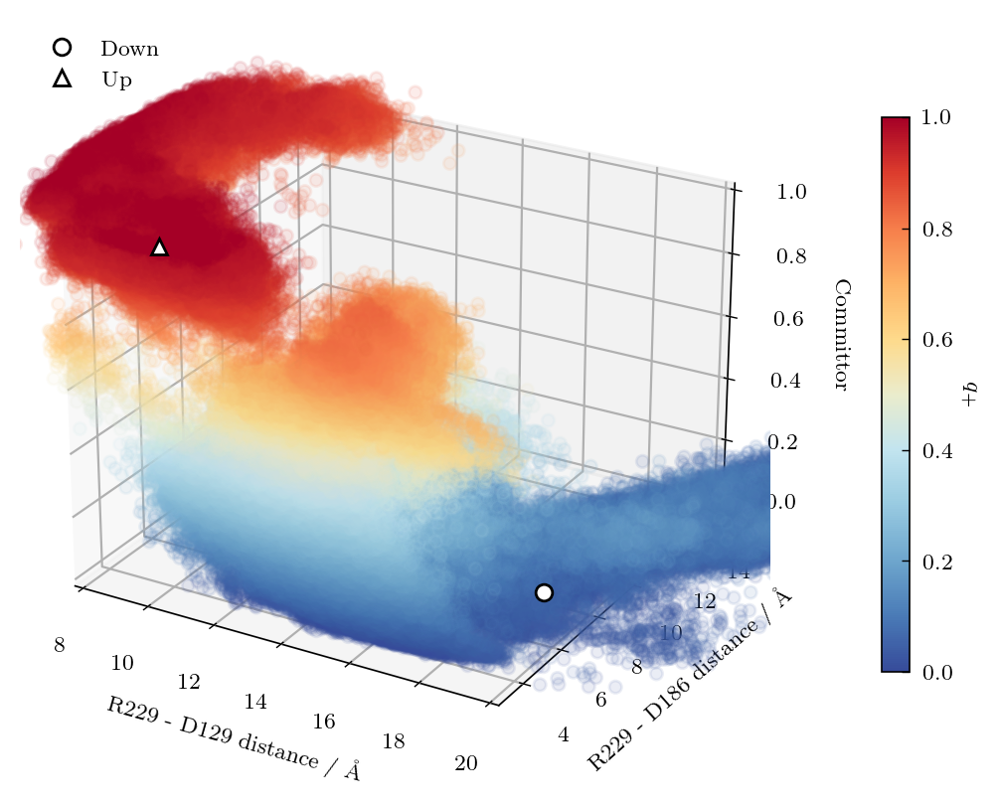

In [60]:
f = plt.figure(figsize=(6, 5), dpi=200)
ax = f.add_subplot(projection="3d")

q = np.concatenate(q_downup[7]).clip(min=0, max=1)
ax.scatter(
    sb_arr[inds, sb_ids[1]] * 10,
    sb_arr[inds, sb_ids[3]] * 10,
    q[inds],
    c=q[inds],
    cmap=cm_div,
    alpha=0.1,
)
ax.set_xlabel(f"{sb_labels[sb_ids[1] - 30]} distance / Å")
ax.set_ylabel(f"{sb_labels[sb_ids[3] - 30]} distance / Å")
ax.zaxis.set_rotate_label(False)
ax.set_zlabel("Committor", rotation=-90)
ax.set_xlim([8, 20])
ax.set_ylim([3, 15])
ax.set_zlim([0, 1.0])
cbar = plt.colorbar(h, ax=ax, pad=0.12, fraction=0.03, label="$q_+$")
cbar.solids.set(alpha=1)
cbar.set_label("$q_+$", rotation=-90, labelpad=10)
# ax.set_title('Committor, down to up transition, 20 ns lag')

ax.grid(visible=True)
ax.plot(
    feat2_models[1, sb_ids[1]] * 10,
    feat2_models[1, sb_ids[3]] * 10,
    0,
    "o",
    mec="k",
    mfc="w",
    ms=6,
    zorder=5,
    label="Down",
)
ax.plot(
    feat2_models[2, sb_ids[1]] * 10,
    feat2_models[2, sb_ids[3]] * 10,
    1,
    "^",
    mec="k",
    mfc="w",
    ms=6,
    zorder=5,
    label="Up",
)
ax.legend(loc="upper left")
ax.view_init(elev=25)

## Transition state

In [25]:
# extract points which are between 0.45 and 0.55 committor
q = np.concatenate(q_downup[7])
q_ts_inds = ((q < 0.6) & (q > 0.4)).nonzero()[0]
q_ts = q[q_ts_inds]

In [26]:
sb_ts = sb_arr[q_ts_inds]

In [27]:
len(q_ts)

149314

[None]

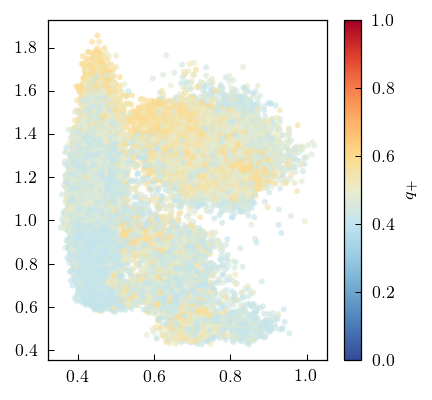

In [28]:
f = plt.figure()
ax = plt.gca()
h = ax.scatter(
    sb_ts[..., sb_ids[0]],
    sb_ts[..., sb_ids[2]],
    c=q_ts,
    alpha=0.5,
    cmap=cm_div,
    vmin=0,
    vmax=1,
)
cbar = plt.colorbar(h, ax=ax, label="$q_+$")
cbar.solids.set(alpha=1)

In [29]:
for i in util.find_closest_points((0.55, 1.1), sb_ts[:, [42, 47]], n=10):
    j = q_ts_inds[i]
    if j < 3_000_000:
        print(j, util.anton_frame(j), q[j])
    else:
        print(j, (j - 3_000_000) // 10001, (j - 3_000_000) % 10001, q[j])

3010072 1 71 0.4088330559073656
1269575 (126, 9575) 0.40763417364685767
3010168 1 167 0.4421386144434172
3095049 9 5040 0.43978535754022596
2571525 (202, 1525) 0.4226949549159978
3010094 1 93 0.4714104363452045
2979430 (292, 9430) 0.5601848708725958
2985755 (293, 5755) 0.5712550749040384
2995755 (294, 5755) 0.5712550749040384
2975755 (292, 5755) 0.5712550749040384


[None]

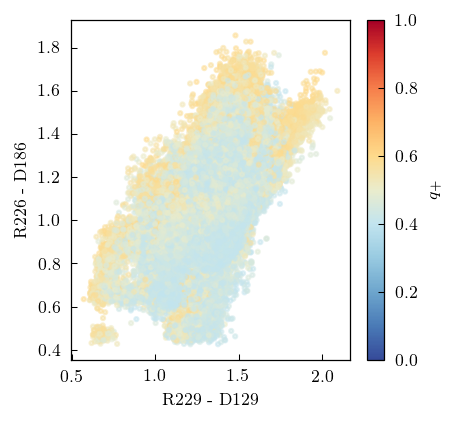

In [30]:
f = plt.figure()
ax = plt.gca()
h = ax.scatter(
    sb_ts[..., sb_ids[1]],
    sb_ts[..., sb_ids[2]],
    c=q_ts,
    alpha=0.5,
    cmap=cm_div,
    vmin=0,
    vmax=1,
)
plt.xlabel(sb_labels[sb_ids[1] - 30])
plt.ylabel(sb_labels[sb_ids[2] - 30])
cbar = plt.colorbar(h, ax=ax, label="$q_+$")
cbar.solids.set(alpha=1)

[None]

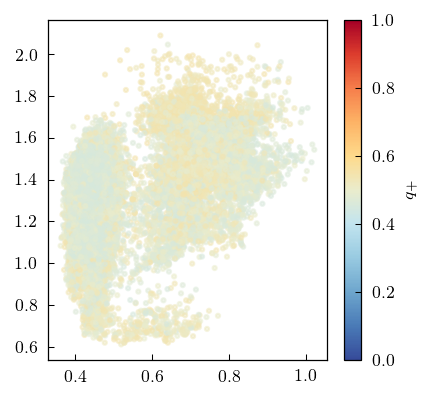

In [128]:
f = plt.figure()
ax = plt.gca()
h = ax.scatter(
    sb_ts[..., sb_ids[0]],
    sb_ts[..., sb_ids[1]],
    c=q_ts,
    alpha=0.5,
    cmap=cm_div,
    vmin=0,
    vmax=1,
)
cbar = plt.colorbar(h, ax=ax, label="$q_+$")
cbar.solids.set(alpha=1)

In [134]:
for i in util.find_closest_points((0.4, 1.9), sb_ts[:, [42, 48]], n=10):
    j = q_ts_inds[i]
    if j < 3_000_000:
        print(j, util.anton_frame(j))
    else:
        print(j, (j - 3_000_000) // 10001, (j - 3_000_000) % 10001)

2627860 (216, 7860)
2622921 (216, 2921)
2623213 (216, 3213)
2624130 (216, 4130)
2623198 (216, 3198)
2623216 (216, 3216)
2622955 (216, 2955)
2893017 (258, 3017)
2625920 (216, 5920)
2622915 (216, 2915)


In [132]:
for i in util.find_closest_points((0.5, 1.9), sb_ts[:, [42, 48]], n=10):
    j = q_ts_inds[i]
    if j < 3_000_000:
        print(j, util.anton_frame(j))
    else:
        print(j, (j - 3_000_000) // 10001, (j - 3_000_000) % 10001)

2627860 (216, 7860)
2623213 (216, 3213)
2623198 (216, 3198)
2623216 (216, 3216)
2622921 (216, 2921)
2624130 (216, 4130)
2622955 (216, 2955)
2625920 (216, 5920)
2622915 (216, 2915)
2627869 (216, 7869)


In [133]:
for j in util.find_closest_points((0.5, 2.0), sb_arr[:, [42, 48]], n=10):
    if j < 3_000_000:
        print(j, util.anton_frame(j), q_arr[j])
    else:
        print(j, (j - 3_000_000) // 10001, (j - 3_000_000) % 10001)

2621956 (216, 1956) 0.571380277796228
2622021 (216, 2021) 0.561126784449419
2622005 (216, 2005) 0.5978899550052881
2622921 (216, 2921) 0.5121280472206977
2880235 (257, 235) 0.5733890284237739
2622019 (216, 2019) 0.5488876712976185
2622053 (216, 2053) 0.5820098250227038
2626299 (216, 6299) 0.5092402788055833
2622020 (216, 2020) 0.5647312380703617
2622013 (216, 2013) 0.556861574597263


[None]

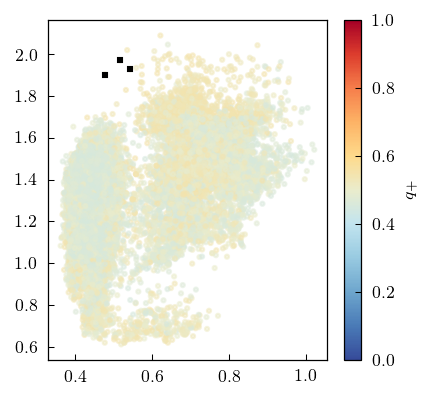

In [110]:
f = plt.figure()
ax = plt.gca()
h = ax.scatter(
    sb_ts[..., sb_ids[0]],
    sb_ts[..., sb_ids[1]],
    c=q_ts,
    alpha=0.5,
    cmap=cm_div,
    vmin=0,
    vmax=1,
)
ids = [2627860, 2622921, 2623213]
ax.plot(sb_arr[ids, sb_ids[0]], sb_arr[ids, sb_ids[1]], "sk")
cbar = plt.colorbar(h, ax=ax, label="$q_+$")
cbar.solids.set(alpha=1)

(-50.0, 20.0)

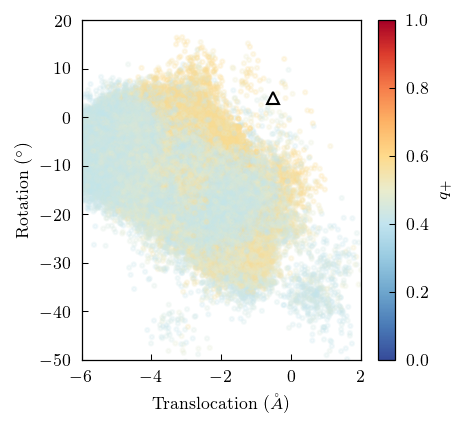

In [118]:
f = plt.figure()
ax = plt.gca()
plt.scatter(
    cv_arr[q_ts_inds, 0],
    cv_arr[q_ts_inds, 1],
    c=q_ts,
    alpha=0.2,
    cmap=cm_div,
    vmin=0,
    vmax=1,
)
cbar = plt.colorbar(h, ax=ax, label="$q_+$")
cbar.solids.set(alpha=1)
plotting.format_cvs(ax, ms=6)
plt.xlim([-6, 2])
plt.ylim([-50, 20])

[None]

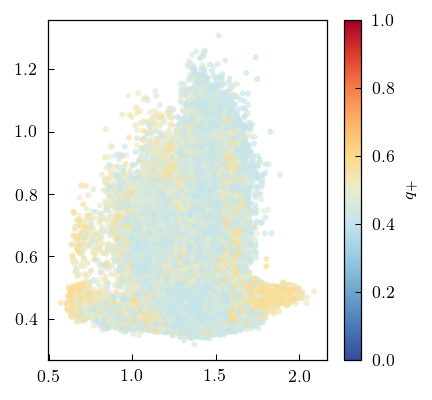

In [69]:
f = plt.figure()
ax = plt.gca()
h = ax.scatter(
    sb_ts[..., sb_ids[1]],
    sb_ts[..., sb_ids[3]],
    c=q_ts,
    alpha=0.5,
    cmap=cm_div,
    vmin=0,
    vmax=1,
)
cbar = plt.colorbar(h, ax=ax, label="$q_+$")
cbar.solids.set(alpha=1)

In [70]:
# R229-D129 and R229 - D186
lowq = (q < 0.7).nonzero()[0]
arr = sb_arr[lowq]
for i in util.find_closest_points((0.9, 0.4), arr[:, [48, 53]], n=20):
    j = lowq[i]
    if j < 3_000_000:
        print(j, util.anton_frame(j), q[j])
    else:
        print(j, (j - 3_000_000) // 10001, (j - 3_000_000) % 10001, q[j])

2721240 (230, 1240) 0.5817147229452284
2723176 (230, 3176) 0.339737676458926
2721207 (230, 1207) 0.5461729121724932
2722271 (230, 2271) 0.3311514431536447
154654 (15, 4654) 0.20695516429404165
2721140 (230, 1140) 0.5070093762000228
2721006 (230, 1006) 0.5787035777496622
2721537 (230, 1537) 0.4806891956215516
2721173 (230, 1173) 0.5516518972306965
2720973 (230, 973) 0.5041767592319891
2720877 (230, 877) 0.6198575451817453
2932146 (280, 2146) 0.4770831386311135
3011919 1 1918 0.30120076238541293
2721377 (230, 1377) 0.5771704258019245
2722376 (230, 2376) 0.3229483020763729
2934752 (280, 4752) 0.44570457452374185
2933514 (280, 3514) 0.37888453340253725
2723546 (230, 3546) 0.29218093278074436
2936482 (280, 6482) 0.44868992264646956
1252074 (125, 2074) 0.3882879976464238


In [77]:
# R229-D129 and R229 - D186
lowq = ((q < 0.7) & (q > 0.5)).nonzero()[0]
arr = sb_arr[lowq]
for i in util.find_closest_points((1.0, 0.4), arr[:, [48, 53]], n=10):
    j = lowq[i]
    if j < 3_000_000:
        print(j, util.anton_frame(j), q[j])
    else:
        print(j, (j - 3_000_000) // 10001, (j - 3_000_000) % 10001, q[j])

2720760 (230, 760) 0.5683514856922801
2937317 (280, 7317) 0.5177112159351211
2720757 (230, 757) 0.573605925918521
2933280 (280, 3280) 0.5417609536704222
3021058 2 1056 0.544731850833629
2720835 (230, 835) 0.5447014543702331
2594089 (208, 4089) 0.6718638271221615
1252386 (125, 2386) 0.5017192790809748
2721014 (230, 1014) 0.5283881829754816
2721393 (230, 1393) 0.5039417449326554


In [76]:
# R229-D129 and R229 - D186
lowq = ((q < 0.7) & (q > 0.5)).nonzero()[0]
arr = sb_arr[lowq]
for i in util.find_closest_points((1.1, 0.4), arr[:, [48, 53]], n=10):
    j = lowq[i]
    if j < 3_000_000:
        print(j, util.anton_frame(j), q[j])
    else:
        print(j, (j - 3_000_000) // 10001, (j - 3_000_000) % 10001, q[j])

1252248 (125, 2248) 0.5028920741742874
3150639 15 624 0.6108928519908041
1210467 (121, 467) 0.5993095171379059
668475 (66, 8475) 0.5008398671420119
3150409 15 394 0.6051427439264443
2652260 (219, 2260) 0.5177597919408106
1213971 (121, 3971) 0.6046952805949375
2932955 (280, 2955) 0.5122638381934902
2652099 (219, 2099) 0.6136236073542822
2594102 (208, 4102) 0.5889421650748664


In [78]:
# R229-D129 and R229 - D186
lowq = ((q < 0.7) & (q > 0.5)).nonzero()[0]
arr = sb_arr[lowq]
for i in util.find_closest_points((1.2, 0.4), arr[:, [48, 53]], n=10):
    j = lowq[i]
    if j < 3_000_000:
        print(j, util.anton_frame(j), q[j])
    else:
        print(j, (j - 3_000_000) // 10001, (j - 3_000_000) % 10001, q[j])

1251303 (125, 1303) 0.5303802473629492
662448 (66, 2448) 0.516591454680542
2594249 (208, 4249) 0.5569510961023408
668465 (66, 8465) 0.5302914984616658
2790417 (244, 417) 0.5065445814363588
2560252 (201, 252) 0.5931801462810631
3020972 2 970 0.6706820650226982
1998902 (181, 8902) 0.5413330605581437
108902 (10, 8902) 0.5413330605581437
3150644 15 629 0.5492880830697924


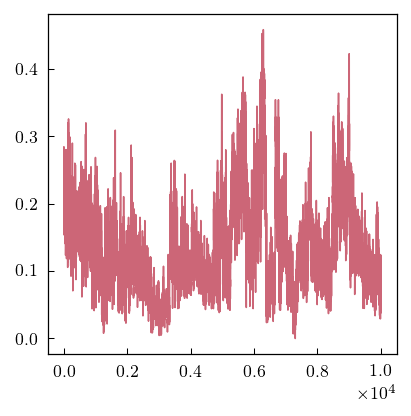

In [58]:
# anton 14 = 237 + 14 - 3
i = 237 + 14 - 3
plt.plot(q_downup[7][i])

# Gradient of committor

In [33]:
sb1 = sb_ids[0]
sb2 = sb_ids[1]
com = np.concatenate(weights[7])
r = [[3, 20], [3, 20]]
q_dens, xe, ye = np.histogram2d(
    sb_arr[:, sb1] * 10,
    sb_arr[:, sb2] * 10,
    bins=100,
    density=False,
    range=r,
    weights=q * com,
)
w_dens, _, _ = np.histogram2d(
    sb_arr[:, sb1] * 10,
    sb_arr[:, sb2] * 10,
    bins=100,
    density=False,
    range=r,
    weights=com,
)
q_bin = q_dens / w_dens

/tmp/jobs/17599323/ipykernel_3237/3292198264.py:21: RuntimeWarning: invalid value encountered in true_divide
  q_bin = (q_dens / w_dens)


In [48]:
grad = np.gradient(q_bin.T, xe[1] - xe[0], ye[1] - ye[0])

In [49]:
grad[0].shape

(100, 100)

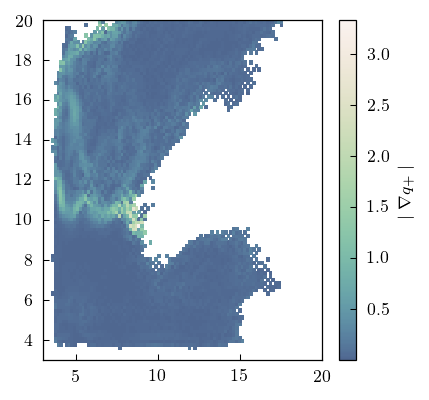

In [57]:
plt.pcolor(xe, ye, np.sqrt(grad[0] ** 2 + grad[1] ** 2), cmap=cm_seq)
plt.colorbar(label="$\\mid \\nabla q_+ \\mid$")